In [1]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import pandas as pd
import geopandas as gpd
from rasterio.mask import mask

In [2]:
# Path to your hyperspectral image
file_path = "data/Kastoria/Kastoria.tif"

# Open the file using rasterio
with rasterio.open(file_path) as src:
    # Read metadata
    width = src.width
    height = src.height
    count = src.count  # Number of bands
    crs = src.crs      # Coordinate Reference System
    transform = src.transform  # Affine transform

    print(f"Width: {width}")
    print(f"Height: {height}")
    print(f"Number of bands: {count}")
    print(f"Shape: ({height}, {width}, {count})")
    print(f"CRS: {crs}")
    print(f"Transform: {transform}")


Width: 2281
Height: 2017
Number of bands: 240
Shape: (2017, 2281, 240)
CRS: EPSG:32634
Transform: | 10.00, 0.00, 509220.00|
| 0.00,-10.00, 4493070.00|
| 0.00, 0.00, 1.00|


   id                                           geometry
0 NaN  POLYGON ((521316.976 4489680.186, 526163.215 4...
EPSG:32634


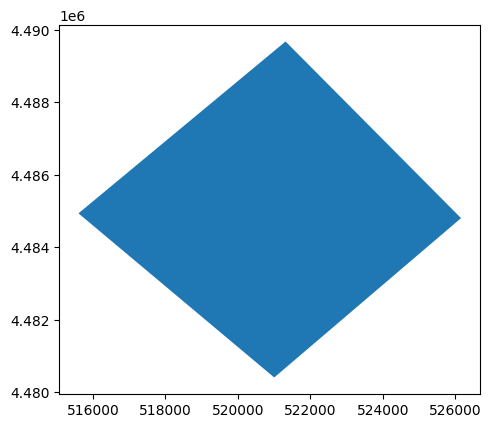

In [3]:
# Path to your .shp file (other files like .shx, .dbf must be in the same folder)
shapefile_path = "/home/alex/final_area_vector.shp"

# Load the shapefile
gdf = gpd.read_file(shapefile_path)

# Display basic info
print(gdf)
print(gdf.crs)  # Check coordinate reference system

import matplotlib.pyplot as plt

gdf.plot()
plt.show()



1. Περικοπή της Raster με βάση το Shapefile (AOI)

In [4]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import json
import numpy as np

# Φόρτωσε το shapefile
gdf = gpd.read_file(shapefile_path)

# Μετατροπή του AOI σε GeoJSON format
geometry = [json.loads(gdf.to_json())['features'][0]['geometry']]

# Φόρτωσε και κάνε mask στο raster
with rasterio.open(file_path) as src:
    masked, masked_transform = mask(src, geometry, crop=True)
    meta = src.meta.copy()

print(f"Clipped raster shape: {masked.shape} (bands, height, width)")
# masked shape: (240, H, W)

Clipped raster shape: (240, 930, 1058) (bands, height, width)


2. Οπτικοποίηση RGB Καναλιών για Μια Ημερομηνία

3. Υπολογισμός NDVI για Κάθε Ημερομηνία

/tmp/ipykernel_4821/1292439403.py:13: RuntimeWarning: invalid value encountered in divide
  (nir - red) / (nir + red)


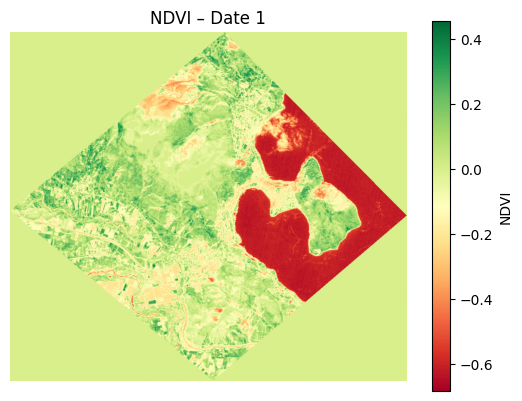

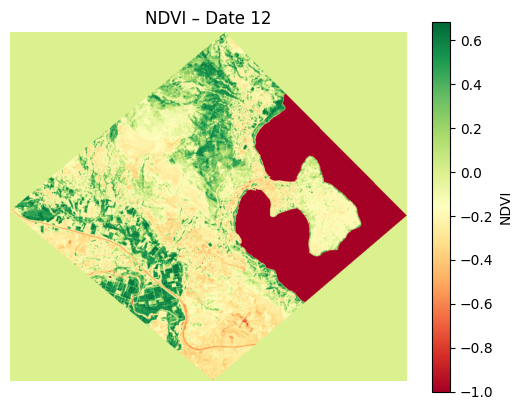

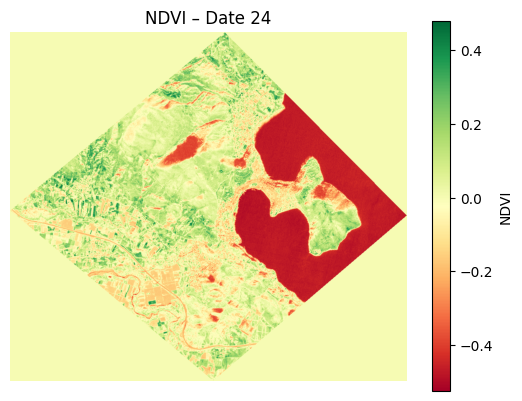

[np.float32(-0.058576483),
 np.float32(-0.0010955109),
 np.float32(-0.11254022),
 np.float32(-0.11076492),
 np.float32(-0.12018078),
 np.float32(-0.07912751),
 np.float32(-0.104685694),
 np.float32(-0.11027255),
 np.float32(-0.10690154),
 np.float32(-0.10537892),
 np.float32(-0.10753049),
 np.float32(-0.10771089),
 np.float32(-0.10527863),
 np.float32(-0.10752012),
 np.float32(-0.10354528),
 np.float32(-0.10234261),
 np.float32(-0.101558775),
 np.float32(-0.090290055),
 np.float32(-0.01709316),
 np.float32(-0.055482265),
 np.float32(-0.0711894),
 np.float32(-0.08001462),
 np.float32(-0.06930621),
 np.float32(-0.04111851)]

In [6]:
# Λίστα για NDVI time series
ndvi_means = []

for date_index in range(24):
    offset = date_index * 10
    red = masked[offset + RED_IDX].astype('float32')
    nir = masked[offset + 3].astype('float32')  # NIR = 4ο κανάλι στη δεκάδα

    # NDVI = (NIR - RED) / (NIR + RED)
    ndvi = np.where(
        (nir + red) == 0,
        0,
        (nir - red) / (nir + red)
    )

    mean_ndvi = np.nanmean(ndvi)
    ndvi_means.append(mean_ndvi)

    # Προαιρετική οπτικοποίηση για κάθε ημερομηνία
    if date_index in [0, 11, 23]:  # Π.χ. δείξε 3 ημερομηνίες
        plt.imshow(ndvi, cmap="RdYlGn")
        plt.title(f"NDVI – Date {date_index + 1}")
        plt.colorbar(label="NDVI")
        plt.axis("off")
        plt.show()

ndvi_means


In [1]:
import matplotlib.pyplot as plt
import numpy as np

import rasterio
from rasterio.mask import mask
import geopandas as gpd
import numpy as np
import json
import matplotlib.pyplot as plt

# === Paths ===
raster_path = "data/Kastoria/Kastoria.tif"
shapefile_path = "/home/alex/final_area_vector.shp"

# === Load AOI from shapefile ===
gdf = gpd.read_file(shapefile_path)

print(f"Shapefile CRS: {gdf.crs}")

# convert AOI geometry to GeoJSON format
geometry = [json.loads(gdf.to_json())['features'][0]['geometry']]

# load raster and apply mask
with rasterio.open(raster_path) as src:
    full_raster = src.read()
    full_meta = src.meta
    print("Raster CRS:", src.crs)

    # clip raster to AOI
    masked_raster, masked_transform = mask(src, geometry, crop=True)
    masked_meta = src.meta.copy()
    masked_meta.update({
        "height": masked_raster.shape[1],
        "width": masked_raster.shape[2],
        "transform": masked_transform
    })

print(f"Full raster shape: {full_raster.shape}")
print(f"Masked raster shape: {masked_raster.shape}")


Shapefile CRS: EPSG:32634
Raster CRS: EPSG:32634
Full raster shape: (240, 2017, 2281)
Masked raster shape: (240, 930, 1058)


In [2]:
def normalize(img):
    return (img - np.nanmin(img)) / (np.nanmax(img) - np.nanmin(img) + 1e-6)

def get_rgb_stack(raster, date_idx):
    offset = date_idx * 10
    r = normalize(raster[offset + 2])
    g = normalize(raster[offset + 1])
    b = normalize(raster[offset + 0])
    return np.stack([r, g, b], axis=-1)

# Convert AOI to raster pixel coordinates
def get_aoi_pixel_coords(geometry, transform):
    coords = np.array(geometry['coordinates'][0])
    pixel_coords = [~transform * (x, y) for x, y in coords]  # inverse transform: (col, row)
    return np.array(pixel_coords)

In [3]:
dates = ["2016-01-25", "2016-02-14", "2016-03-28", "2016-04-04", "2016-04-27", "2016-06-06", "2016-07-03", "2016-07-13", 
         "2016-07-23", "2016-07-26", "2016-08-05", "2016-08-12", "2016-08-15", "2016-08-22", "2016-09-04", "2016-09-14", 
         "2016-10-01", "2016-10-14", "2016-11-13", "2016-12-03", "2016-12-10", "2016-12-20", "2016-12-23", "2016-12-30"]


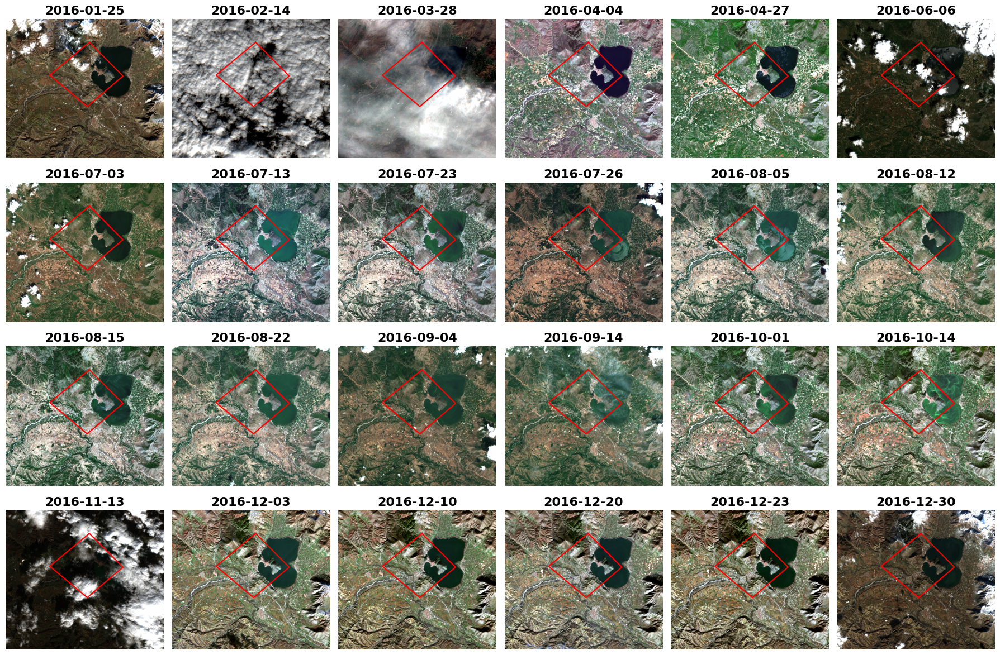

In [ ]:
from rasterio.warp import transform_geom
from shapely.geometry import mapping


fig, axs = plt.subplots(4, 6, figsize=(18, 12))
#fig.suptitle("General Kastoria Area with Area of Interest RGB Composite", fontsize=22)

# Get AOI polygon in pixel coordinates
aoi_pixels = get_aoi_pixel_coords(geometry[0], full_meta['transform'])

for i, ax in enumerate(axs.flat):
    rgb = get_rgb_stack(full_raster, i)
    ax.imshow(rgb)
    ax.set_title(dates[i], fontweight='bold', fontsize=16)
    ax.axis("off")

    # Plot AOI polygon
    xs, ys = zip(*aoi_pixels)
    ax.plot(xs, ys, color='red', linewidth=1.5)

plt.tight_layout()
plt.savefig("figures/area_rgb.svg", dpi=300)


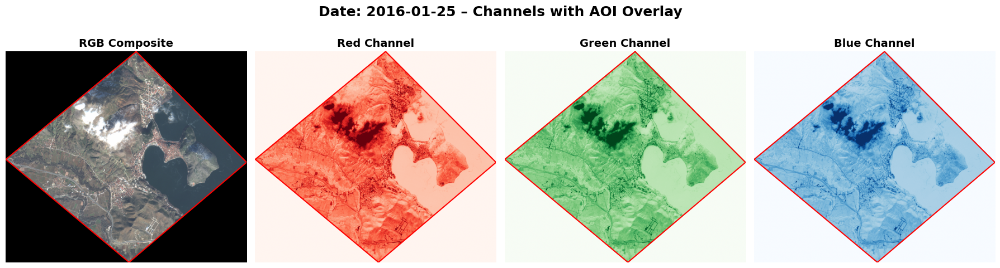

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import shape

# === Constants ===
RED_IDX = 2
GREEN_IDX = 1
BLUE_IDX = 0
date_index = 0
offset = date_index * 10

# === Normalize helper ===
def normalize(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-6)

# === Extract channels ===
r = masked_raster[offset + RED_IDX]
g = masked_raster[offset + GREEN_IDX]
b = masked_raster[offset + BLUE_IDX]

r_norm = normalize(r)
g_norm = normalize(g)
b_norm = normalize(b)
rgb = np.stack([r_norm, g_norm, b_norm], axis=-1)

# === AOI pixel coordinates ===
from shapely.geometry import shape
aoi_geom = shape(geometry[0])
aoi_coords = np.array(aoi_geom.exterior.coords)
aoi_pixels = np.array([~masked_meta["transform"] * (x, y) for x, y in aoi_coords])  # (col, row)
xs, ys = zip(*aoi_pixels)

# === Plot 4 subplots: RGB, R, G, B ===
fig, axs = plt.subplots(1, 4, figsize=(18, 5))
titles = ["RGB Composite", "Red Channel", "Green Channel", "Blue Channel"]
images = [rgb, r_norm, g_norm, b_norm]
cmaps = [None, 'Reds', 'Greens', 'Blues']

for ax, img, title, cmap in zip(axs, images, titles, cmaps):
    ax.imshow(img if cmap is None else img, cmap=cmap)
    ax.set_title(title, fontweight='bold', fontsize=14)
    ax.plot(xs, ys, color='red', linewidth=1.5)
    ax.axis("off")

plt.suptitle(f"Date: {dates[date_index]}", fontsize=18, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


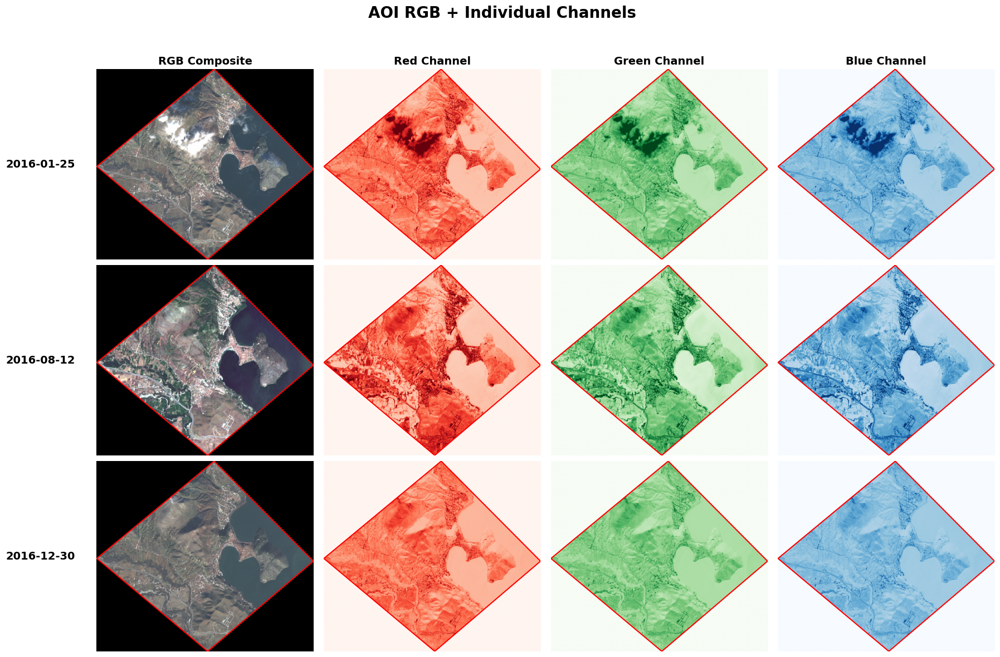

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import shape

# === Constants ===
RED_IDX = 2
GREEN_IDX = 1
BLUE_IDX = 0
dates_to_plot = [0, 11, 23]  # Indices of the dates to visualize

titles = ["RGB Composite", "Red Channel", "Green Channel", "Blue Channel"]
cmaps = [None, 'Reds', 'Greens', 'Blues']

# === Normalize helper ===
def normalize(img):
    return (img - img.min()) / (img.max() - img.min() + 1e-6)

# === Get AOI pixel coordinates ===
aoi_geom = shape(geometry[0])
aoi_coords = np.array(aoi_geom.exterior.coords)
aoi_pixels = np.array([~masked_meta["transform"] * (x, y) for x, y in aoi_coords])  # (col, row)
xs, ys = zip(*aoi_pixels)

# === Plot grid: 3 dates × 4 channels ===
fig, axs = plt.subplots(len(dates_to_plot), 4, figsize=(18, 12))
fig.suptitle("AOI RGB + Individual Channels", fontsize=20, fontweight='bold')

for row_idx, date_index in enumerate(dates_to_plot):
    offset = date_index * 10
    r = masked_raster[offset + RED_IDX]
    g = masked_raster[offset + GREEN_IDX]
    b = masked_raster[offset + BLUE_IDX]

    r_norm = normalize(r)
    g_norm = normalize(g)
    b_norm = normalize(b)
    rgb = np.stack([r_norm, g_norm, b_norm], axis=-1)

    images = [rgb, r_norm, g_norm, b_norm]

    for col_idx in range(4):
        ax = axs[row_idx, col_idx] if len(dates_to_plot) > 1 else axs[col_idx]
        ax.set_facecolor('white')
        img = images[col_idx]
        cmap = cmaps[col_idx]

        ax.imshow(img if cmap is None else img, cmap=cmap)
        ax.plot(xs, ys, color='red', linewidth=1.5)
        ax.axis("off")

        # Titles
        if row_idx == 0:
            ax.set_title(titles[col_idx], fontweight='bold', fontsize=14)
        if col_idx == 0:
            ax.text(-0.1, 0.5, dates[date_index], fontsize=14, fontweight='bold',
                    transform=ax.transAxes, va='center', ha='right')

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("figures/area_rgb_unique.svg", dpi=300)
plt.show()


In [ ]:
# Assuming: 24 time steps × 10 bands = 240 channels
H, W = full_img.shape[1:]
full_img = full_img.reshape(24, 10, H, W)

bands = ["Blue", "Green", "Red", "NIR", "SWIR1", "SWIR2",
         "NDVI", "MSAVI", "NDWI", "NDBI"]

# Wrap in xarray DataArray
cube = xr.DataArray(
    full_img,
    dims=("time", "band", "y", "x"),
    coords=dict(time=dates, band=bands)
)


ValueError: too many values to unpack (expected 2)

In [15]:
cube_aoi = cube.where(aoi_mask)

ValueError: operands could not be broadcast together with shapes (879,1021) (24,10,2017,2281) () 

In [ ]:
for t in [0, 12, 23]:  # beginning, middle, end
    cube_aoi.sel(time=dates[t], band="NDVI").plot(
        cmap="YlGn", vmin=0, vmax=1, figsize=(6,6))
    plt.title(f"NDVI – {dates[t].date()}")
    plt.axis("off")
    plt.show()

# Collapse spatial dimensions, keeping only time × band
mean_index = cube_aoi.mean(dim=("y", "x"), skipna=True)

# Convert to DataFrame
df = mean_index.to_pandas()
df

In [ ]:
plt.figure(figsize=(10, 5))
for idx in ["NDVI", "NDWI", "NDBI"]:
    plt.plot(df.index, df[idx], marker='o', label=idx)

plt.title("Average Index Values Over AOI")
plt.xlabel("Date")
plt.ylabel("Index Value")
plt.grid(True, linestyle=":")
plt.legend()
plt.tight_layout()
plt.show()
